In [1]:
import os
os.environ['TRANSFORMERS_CACHE'] = "B:/cache/"

In [2]:
import transformers
from transformers import pipeline,AutoTokenizer,AutoModelForSequenceClassification, TrainingArguments, Trainer,AutoConfig
import torch
import numpy as np

import scipy as sp
import pandas as pd
import shap
import re
from sklearn.metrics import mean_squared_error,confusion_matrix,accuracy_score,precision_score,classification_report,recall_score
import json
from datasets import load_dataset, load_metric
from torchinfo import summary

# Create custom dataset

In [19]:
df = pd.read_excel(r'customer_issues.xlsx')
df.head(5)

,Consumer complaint narrative,Product,Issue
0,"Information is missing from my credit profile,...","Credit reporting, credit repair services, or o...",Incorrect information on your report
1,"Last several months, I have sent in complaints...","Credit reporting, credit repair services, or o...",Incorrect information on your report
2,Please remove this account XXXX has placed in ...,"Credit reporting, credit repair services, or o...",Incorrect information on your report
3,I am XXXX XXXX and I am submitting this compla...,"Credit reporting, credit repair services, or o...",Incorrect information on your report
4,Hi I am submitting this XXXX XXXX without any ...,"Credit reporting, credit repair services, or o...",Incorrect information on your report


In [12]:
df.Product.unique()

array(['Credit reporting, credit repair services, or other personal consumer reports',
       'Payday loan, title loan, or personal loan',
       'Credit card or prepaid card', 'Mortgage', 'Vehicle loan or lease',
       'Student loan', 'Checking or savings account',
       'Money transfer, virtual currency, or money service',
       'Debt collection', 'Bank account or service', 'Credit reporting',
       'Credit card', 'Consumer Loan', 'Payday loan',
       'Other financial service', 'Prepaid card', 'Money transfers',
       'Virtual currency'], dtype=object)

In [11]:
df.Issue.unique()

array(['Incorrect information on your report',
       'Managing, opening, or closing your mobile wallet account',
       'Took or threatened to take negative or legal action',
       "Problem with a credit reporting company's investigation into an existing problem",
       'Struggling to pay mortgage',
       'Account opening, closing, or management',
       'Attempts to collect debt not owed',
       'Problem with a purchase shown on your statement',
       'Incorrect information on credit report',
       'Problem with a purchase or transfer',
       'Dealing with your lender or servicer', 'Fraud or scam',
       'Settlement process and costs', 'Written notification about debt',
       'Advertising and marketing, including promotional offers',
       'Trouble during payment process', 'Improper use of your report',
       'Managing an account', 'Struggling to pay your bill',
       'Managing the loan or lease', 'Closing an account',
       'Dealing with my lender or servicer',
       '

In [20]:
df.Issue.nunique()

158

In [5]:
df.shape

(355260, 5)

In [48]:
#df2 = df.sample(2000)
df21 = df[df['Issue'] == 'Incorrect information on your report'].sample(1000)
df22 = df[df['Issue'] == 'Attempts to collect debt not owed'].sample(1000)
df23 = df[df['Issue'] == 'Improper use of your report'].sample(1000)
df24 = df[df['Issue'] == "Problem with a credit reporting company's investigation into an existing problem"].sample(1000)

df2 = pd.concat([df21,df22,df23,df24])
df2 = df2[['Consumer complaint narrative','Issue']]

target_map = {'Incorrect information on your report':0, 
              'Attempts to collect debt not owed':1,
              'Improper use of your report':2,
              "Problem with a credit reporting company's investigation into an existing problem":3}
              
df2['label'] = df2.Issue.map(target_map)
    
df2.columns = ['sentence','Issue','label']    
df2 = df2[['sentence','label']]
df2.to_csv('issues4.csv', index = None)    
df2.label.value_counts()

0    1000
1    1000
2    1000
3    1000
Name: label, dtype: int64

# Load custom dataset to transformer datasets

In [3]:
df = pd.read_csv(r'issues4.csv')
df

,sentence,label
0,Experian Credit bureau has not provided with v...,0
1,XXXX XXXX is not updating my information to cr...,0
2,My loans have always been deferred and I have ...,0
3,XXXX XXXX XXXX The credit bureaus was properl...,0
4,XXXX : Has incorrect information on my Credit ...,0
...,...,...
3995,"This is XXXX XXXX, who is submitting this CFPB...",3
3996,Below is a copy of the letter I wrote to Comen...,3
3997,On XX/XX/2021 I sent a letter regarding inaccu...,3
3998,I am unaware of the above listed accounts. Ple...,3


In [9]:
dataset = load_dataset('csv', data_files = 'issues4.csv')
dataset

Using custom data configuration default-3aafcba24f97ddec


Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

0 tables [00:00, ? tables/s]

Dataset csv downloaded and prepared to C:/Users/Kevin Boss/.cache/huggingface/datasets/csv/default-3aafcba24f97ddec/0.0.0/6b34fb8fcf56f7c8ba51dc895bfa2bfbe43546f190a60fcf74bb5e8afdcc2317. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['sentence', 'label'],
        num_rows: 4000
    })
})

In [50]:
split = dataset['train'].train_test_split(test_size = 0.3)
split 

DatasetDict({
    train: Dataset({
        features: ['sentence', 'label'],
        num_rows: 2800
    })
    test: Dataset({
        features: ['sentence', 'label'],
        num_rows: 1200
    })
})

In [101]:
split['test'].to_csv('issues_test.csv')

Creating CSV from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

1173032

In [102]:
split['train'].to_csv('issues_train.csv')

Creating CSV from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

2522691

# Transformers

## Tokenizer

In [52]:
checkpoint = 'distilbert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(checkpoint)

loading configuration file https://huggingface.co/distilbert-base-uncased/resolve/main/config.json from cache at C:\Users\Kevin Boss/.cache\huggingface\transformers\23454919702d26495337f3da04d1655c7ee010d5ec9d77bdb9e399e00302c0a1.91b885ab15d631bf9cee9dc9d25ece0afd932f2f5130eba28f2055b2220c0333
Model config DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.21.3",
  "vocab_size": 30522
}

loading file https://huggingface.co/distilbert-base-uncased/resolve/main/vocab.txt from cache at C:\Users\Kevin Boss/.cache\huggingface\transformers\0

In [53]:
# 不需要 padding， trainer 自动handle padding
# 不用map这种方法还会报错

def token_batch_prcess(batch):
    return tokenizer(batch['sentence'], truncation= True)

tokenized_datasets = split.map(token_batch_prcess, batched= True)

  0%|          | 0/3 [00:00<?, ?ba/s]

  0%|          | 0/2 [00:00<?, ?ba/s]

In [54]:
tokenized_datasets

DatasetDict({
    train: Dataset({
        features: ['sentence', 'label', 'input_ids', 'attention_mask'],
        num_rows: 2800
    })
    test: Dataset({
        features: ['sentence', 'label', 'input_ids', 'attention_mask'],
        num_rows: 1200
    })
})

In [55]:
print(tokenized_datasets['train'][10])

{'sentence': "I receive a XXXX, XXXX and Transunion credit report on XXXX XXXX and Derogatory Remarks of 30-59-60-90 days late and deliquency of XXXX XXXX XXXX auto loan # XXXX And unauthorized Hard Inquiries hasn't been removed permanently from XXXX, XXXX and Transunion.. \nI have only four tradeline accounts of XXXX, XXXX XXXX XXXX, XXXX and XXXX XXXX that are active with XXXX, but accounts mentioned are not been displayed on Transunion and XXXX. \nWhy XXXX, XXXX  and Transunion not displaying Current on XXXX account as all accounts are Current. \n\nA Legal letter has been implemented for XXXX, XXXX, Transunion and XXXX to remove the derogatory remarks and all unauthorized hard inquiries on my credit report.", 'label': 3, 'input_ids': [101, 1045, 4374, 1037, 22038, 20348, 1010, 22038, 20348, 1998, 9099, 19496, 2239, 4923, 3189, 2006, 22038, 20348, 22038, 20348, 1998, 4315, 18170, 7062, 12629, 1997, 2382, 1011, 5354, 1011, 3438, 1011, 3938, 2420, 2397, 1998, 3972, 7413, 9407, 1997, 22

## Automodel 

In [3]:
# all parameters are trainable
checkpoint = 'distilbert-base-uncased'
model = AutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels = 4)
summary(model)

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

`huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in B:\cache. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development


Downloading:   0%|          | 0.00/268M [00:00<?, ?B/s]

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_transform.bias', 'vocab_projector.weight', 'vocab_projector.bias', 'vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_layer_norm.weight']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier.bias', 'pre_classifier.weight', 'classi

Layer (type:depth-idx)                                  Param #
DistilBertForSequenceClassification                     --
├─DistilBertModel: 1-1                                  --
│    └─Embeddings: 2-1                                  --
│    │    └─Embedding: 3-1                              23,440,896
│    │    └─Embedding: 3-2                              393,216
│    │    └─LayerNorm: 3-3                              1,536
│    │    └─Dropout: 3-4                                --
│    └─Transformer: 2-2                                 --
│    │    └─ModuleList: 3-5                             42,527,232
├─Linear: 1-2                                           590,592
├─Linear: 1-3                                           3,076
├─Dropout: 1-4                                          --
Total params: 66,956,548
Trainable params: 66,956,548
Non-trainable params: 0

In [4]:
model

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
       

## Training argument 

In [57]:
training_args = TrainingArguments(output_dir= 'test1', 
                                  evaluation_strategy= 'epoch', 
                                  save_strategy='epoch',
                                  num_train_epochs=3,
                                  per_device_train_batch_size= 16,
                                  per_device_eval_batch_size=64)

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


## Start trainer

In [58]:
trainer = Trainer(model, 
                  training_args, 
                  train_dataset = tokenized_datasets['train'], 
                  eval_dataset=tokenized_datasets['test'], 
                  tokenizer= tokenizer )
trainer.train()

The following columns in the training set don't have a corresponding argument in `DistilBertForSequenceClassification.forward` and have been ignored: sentence. If sentence are not expected by `DistilBertForSequenceClassification.forward`,  you can safely ignore this message.
This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
***** Running training *****
  Num examples = 2800
  Num Epochs = 3
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 525


Epoch,Training Loss,Validation Loss
1,No log,0.817517
2,No log,0.783039
3,0.737100,0.786969


The following columns in the evaluation set don't have a corresponding argument in `DistilBertForSequenceClassification.forward` and have been ignored: sentence. If sentence are not expected by `DistilBertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 1200
  Batch size = 64
Saving model checkpoint to test1\checkpoint-175
Configuration saved in test1\checkpoint-175\config.json
Model weights saved in test1\checkpoint-175\pytorch_model.bin
tokenizer config file saved in test1\checkpoint-175\tokenizer_config.json
Special tokens file saved in test1\checkpoint-175\special_tokens_map.json
The following columns in the evaluation set don't have a corresponding argument in `DistilBertForSequenceClassification.forward` and have been ignored: sentence. If sentence are not expected by `DistilBertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 1200
  Batc

TrainOutput(global_step=525, training_loss=0.725207652137393, metrics={'train_runtime': 12870.7993, 'train_samples_per_second': 0.653, 'train_steps_per_second': 0.041, 'total_flos': 1022568879478272.0, 'train_loss': 0.725207652137393, 'epoch': 3.0})

In [83]:
pred = trainer.predict(tokenized_datasets['test'])
pred

The following columns in the test set don't have a corresponding argument in `DistilBertForSequenceClassification.forward` and have been ignored: sentence. If sentence are not expected by `DistilBertForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Prediction *****
  Num examples = 1200
  Batch size = 64


PredictionOutput(predictions=array([[ 0.16068843,  0.6459941 , -2.182835  ,  0.8315098 ],
       [ 0.92742527,  0.00963221, -2.0355766 ,  0.93263876],
       [ 0.5902424 ,  0.7659598 , -1.3343208 , -0.03733024],
       ...,
       [-0.02454929, -2.2281637 ,  2.2688565 ,  0.43896782],
       [ 1.9566252 ,  1.2112749 , -1.5114415 , -1.3960893 ],
       [ 1.624503  , -1.8976452 , -1.1891241 ,  1.862892  ]],
      dtype=float32), label_ids=array([1, 0, 3, ..., 2, 1, 3], dtype=int64), metrics={'test_loss': 0.7869685888290405, 'test_runtime': 705.1136, 'test_samples_per_second': 1.702, 'test_steps_per_second': 0.027})

## Classification report

In [98]:
predictions = np.argmax(pred.predictions, axis = -1)
print(classification_report(pred.label_ids, predictions, digits = 4))

              precision    recall  f1-score   support

           0     0.5668    0.5340    0.5499       294
           1     0.7895    0.7525    0.7705       299
           2     0.8012    0.8562    0.8278       306
           3     0.6206    0.6412    0.6307       301

    accuracy                         0.6975      1200
   macro avg     0.6945    0.6960    0.6947      1200
weighted avg     0.6955    0.6975    0.6960      1200



In [65]:
# 这个可以不用了 因为 save_strategy='epoch' 自动save了每一个epoch
#trainer.save_model('kb1')

Saving model checkpoint to kb1
Configuration saved in kb1\config.json
Model weights saved in kb1\pytorch_model.bin
tokenizer config file saved in kb1\tokenizer_config.json
Special tokens file saved in kb1\special_tokens_map.json


In [13]:
#trained_model = pipeline('text-classification', model = 'kb1')

# 第二个epoch效果好一点， 这个350怎么来的？ train、一个用2800; 2800/16 = 175 per epoch 
trained_model = pipeline('text-classification', model = 'test1/checkpoint-350')

In [11]:
test = pd.read_csv(r'issues_test.csv')
test.head(5)

,Unnamed: 0,sentence,label
0,0,"On or about XX/XX/2018, I received a final bil...",1
1,1,"XX/XX/2018, I send a letter and supporting doc...",0
2,2,My name is XXXX XXXX and I am sending this req...,3
3,3,"Beginning in XX/XX/2021, XXXX XXXX XXXX, XXXX ...",2
4,4,XX/XX/XXXX {$35000.00} XX/XX/XXXX {$14000.00} ...,0


## Make prediction

In [23]:
pred = trained_model(test['sentence'].tolist()[:10],truncation=True)
pred

[{'label': 'LABEL_1', 'score': 0.6596384644508362},
 {'label': 'LABEL_1', 'score': 0.5067960023880005},
 {'label': 'LABEL_1', 'score': 0.4684475362300873},
 {'label': 'LABEL_0', 'score': 0.6444343328475952},
 {'label': 'LABEL_0', 'score': 0.8359929323196411},
 {'label': 'LABEL_1', 'score': 0.638644278049469},
 {'label': 'LABEL_3', 'score': 0.8258048892021179},
 {'label': 'LABEL_2', 'score': 0.8152672648429871},
 {'label': 'LABEL_3', 'score': 0.5317391157150269},
 {'label': 'LABEL_1', 'score': 0.5013949871063232}]

# Auto config

## Config befre tuning the mocdel

In [26]:
checkpoint = 'distilbert-base-uncased'
config = AutoConfig.from_pretrained(checkpoint)

In [27]:
config

DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.21.3",
  "vocab_size": 30522
}

In [29]:
config.id2label, config.label2id

({0: 'LABEL_0', 1: 'LABEL_1'}, {'LABEL_0': 0, 'LABEL_1': 1})

In [33]:
target_map = {'Incorrect information on your report':0, 
              'Attempts to collect debt not owed':1,
              'Improper use of your report':2,
              "Problem with a credit reporting company's investigation into an existing problem":3}

In [38]:
{v: k for k,v in target_map.items()}

{0: 'Incorrect information on your report',
 1: 'Attempts to collect debt not owed',
 2: 'Improper use of your report',
 3: "Problem with a credit reporting company's investigation into an existing problem"}

In [39]:
config.id2label = {v: k for k,v in target_map.items()}
config.label2id = target_map

In [46]:
model = AutoModelForSequenceClassification.from_pretrained(checkpoint, config = config, cache_dir="B:\chche")
model

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.bias', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_projector.weight', 'vocab_transform.weight']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.weight', 'classifier.bias', 'pre_classifier

DistilBertForSequenceClassification(
  (distilbert): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0): TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
       

## Config after tuning model 

In [52]:
with open('test1/checkpoint-350/config.json') as f:
    j = json.load(f)
j

{'_name_or_path': 'distilbert-base-uncased',
 'activation': 'gelu',
 'architectures': ['DistilBertForSequenceClassification'],
 'attention_dropout': 0.1,
 'dim': 768,
 'dropout': 0.1,
 'hidden_dim': 3072,
 'id2label': {'0': 'LABEL_0', '1': 'LABEL_1', '2': 'LABEL_2', '3': 'LABEL_3'},
 'initializer_range': 0.02,
 'label2id': {'LABEL_0': 0, 'LABEL_1': 1, 'LABEL_2': 2, 'LABEL_3': 3},
 'max_position_embeddings': 512,
 'model_type': 'distilbert',
 'n_heads': 12,
 'n_layers': 6,
 'pad_token_id': 0,
 'problem_type': 'single_label_classification',
 'qa_dropout': 0.1,
 'seq_classif_dropout': 0.2,
 'sinusoidal_pos_embds': False,
 'tie_weights_': True,
 'torch_dtype': 'float32',
 'transformers_version': '4.21.3',
 'vocab_size': 30522}

In [56]:
# 手动改一下 因为名字太长了 
#j['id2label'] = {0: incorrect info, 1: debt issue, 2: report issue, 3: credit issue}
#j['label2id'] = {incorrect info:0 , debt issue:1, report issue:2, credit issue:3}

j['id2label'] = {v: k for k,v in target_map.items()}
j['label2id'] = target_map

with open('test1/checkpoint-350/config.json', 'w') as f:
    json.dump(j,f, indent = 2)

In [ ]:
# 可以看到label 名字已经改好了 
with open('test1/checkpoint-350/config.json') as f:
    j = json.load(f)
j

{'_name_or_path': 'distilbert-base-uncased',
 'activation': 'gelu',
 'architectures': ['DistilBertForSequenceClassification'],
 'attention_dropout': 0.1,
 'dim': 768,
 'dropout': 0.1,
 'hidden_dim': 3072,
 'id2label': {'0': 'Incorrect information on your report',
  '1': 'Attempts to collect debt not owed',
  '2': 'Improper use of your report',
  '3': "Problem with a credit reporting company's investigation into an existing problem"},
 'initializer_range': 0.02,
 'label2id': {'Incorrect information on your report': 0,
  'Attempts to collect debt not owed': 1,
  'Improper use of your report': 2,
  "Problem with a credit reporting company's investigation into an existing problem": 3},
 'max_position_embeddings': 512,
 'model_type': 'distilbert',
 'n_heads': 12,
 'n_layers': 6,
 'pad_token_id': 0,
 'problem_type': 'single_label_classification',
 'qa_dropout': 0.1,
 'seq_classif_dropout': 0.2,
 'sinusoidal_pos_embds': False,
 'tie_weights_': True,
 'torch_dtype': 'float32',
 'transformers_v

# Shap

## 带入一句话

In [6]:
classifier = transformers.pipeline("text-classification",model='test1/checkpoint-350', top_k = 1)
text_data = 'fuck me, I just lost all of my money'
classifier(text_data)

[[{'label': 'Attempts to collect debt not owed', 'score': 0.5214649438858032}]]

In [7]:
explainer = shap.Explainer(classifier)
shap_values = explainer([text_data])
shap.plots.text(shap_values)

In [5]:
shapdf = pd.DataFrame(shap_values.values[0])
shapdf.columns = ['incorrect info on report', 'debt issue', 'Improper use of report', 'credit issue']
shapdf.index = shap_values.data[0]
shapdf

,incorrect info on report,debt issue,Improper use of report,credit issue
,0.000000,0.000000,0.000000,0.000000
fuck,0.008457,0.017806,-0.008205,-0.018057
me,0.002839,0.030492,-0.010081,-0.023250
",",-0.002155,0.058147,-0.024736,-0.031256
I,0.002043,0.021503,-0.012839,-0.010707
just,-0.002373,0.008578,-0.000603,-0.005603
lost,0.012923,0.018795,-0.020040,-0.011678
all,-0.001104,0.011554,-0.003416,-0.007034
of,-0.005819,0.012833,-0.000355,-0.006659
my,0.006381,0.005887,-0.003296,-0.008973


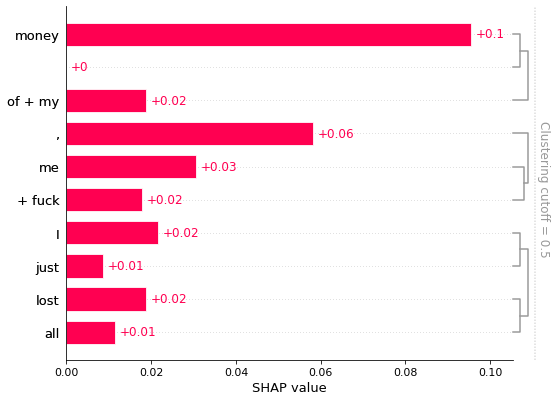

In [84]:
shap.plots.bar(shap_values[0,:,'Attempts to collect debt not owed'])

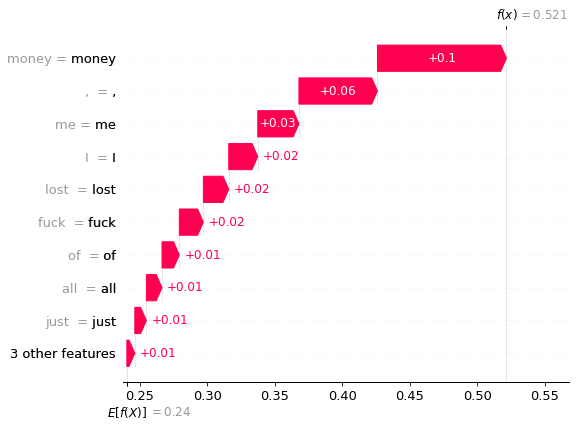

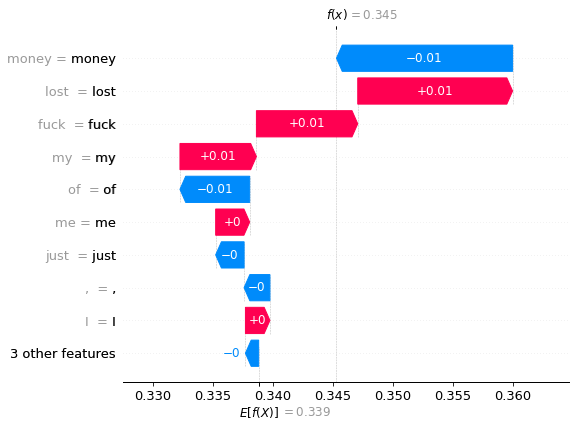

In [86]:
shap.plots.waterfall(shap_values[0,:,'Attempts to collect debt not owed']),
shap.plots.waterfall(shap_values[0,:,'Incorrect information on your report'])

## 同时带入shap多句话

In [10]:
test = pd.read_csv('issues_test.csv')

In [13]:
tests = test['sentence'].sample(5).tolist()
tests

["I applied for a credit card from XXXX XXXX on XXXX/XXXX/XXXX. Experian gave them my credit score of XXXX ; which made the APR 24.99 %. I always check my credit scores at the end of every month. TransUnion ( XXXX excellent ) & XXXX ( XXXX Good ). I 'm unable to check Experian 's because they charge a fee ; however I can check it on my credit card statement. I want to know why there is a 70 difference between the three credit report agencies. \n\nI have worked hard to build and maintain good credit worthiness ; and a credit reporting agency can destroy it by reporting negative information. On XXXX/XXXX/XXXX, I contacted XXXX XXXX and they directed me to Experian. Contacted Experian and was told that they would send me a copy of my credit report. I went on line and got my report and there was nothing on it to give me a LOW SCORE. \n\nSomeone needs to investigate why credit bureaus can do or say whatever they want to about a person that can destroy their credit worthiness. \n\nPLEASE SEE

In [14]:
shap_values = explainer(tests)
shap_values
#shap.plots.bar(shap_values[:,'fuck'])

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer:  20%|██████████████▏                                                        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer:  60%|█████████████████████████████████████▊                         | 3/5 [02:34<00:35, 17.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer:  80%|██████████████████████████████████████████████████▍            | 4/5 [03:38<00:37, 37.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 100%|███████████████████████████████████████████████████████████████| 5/5 [04:19<00:00, 38.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 6it [06:07, 73.51s/it]                                                                            


.values =
array([array([[-5.17117823e-03, -7.57825014e-03,  1.47390040e-03,
                7.39209457e-03],
              [-5.17117823e-03, -7.57825014e-03,  1.47390040e-03,
                7.39209457e-03],
              [-5.17117823e-03, -7.57825014e-03,  1.47390040e-03,
                7.39209457e-03],
              ...,
              [ 4.30296201e-03, -4.37992056e-05,  1.07192756e-03,
               -5.30284381e-03],
              [ 4.30296201e-03, -4.37992056e-05,  1.07192756e-03,
               -5.30284381e-03],
              [ 4.48618084e-05, -3.34967460e-05,  0.00000000e+00,
                2.47098082e-04]])                                ,
       array([[ 1.09532732e-03, -7.78296962e-05,  0.00000000e+00,
                4.67317062e-03],
              [ 1.09532732e-03, -7.78296962e-05,  0.00000000e+00,
                4.67317062e-03],
              [ 5.81458095e-03, -1.22454311e-02,  0.00000000e+00,
                1.22220165e-02],
              [ 5.81458095e-03, -7.12871971e-0

In [15]:
shap.plots.text(shap_values)

In [31]:
classifier(tests, top_k=1)

[[{'label': "Problem with a credit reporting company's investigation into an existing problem",
   'score': 0.6916221976280212}],
 [{'label': 'Incorrect information on your report',
   'score': 0.5664523839950562}],
 [{'label': "Problem with a credit reporting company's investigation into an existing problem",
   'score': 0.6269581317901611}],
 [{'label': 'Incorrect information on your report',
   'score': 0.755236029624939}],
 [{'label': 'Attempts to collect debt not owed', 'score': 0.4610053300857544}]]

## Plotting the top words impacting a specific class

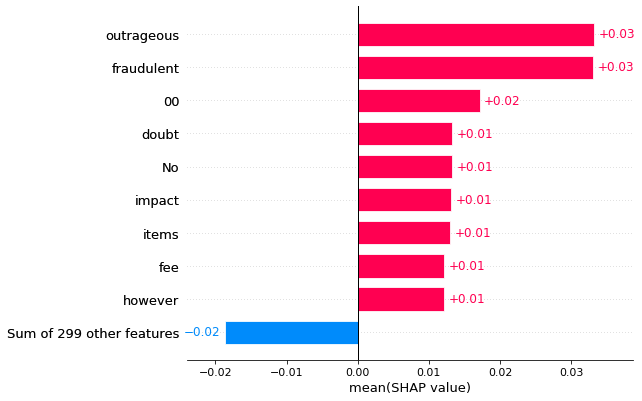

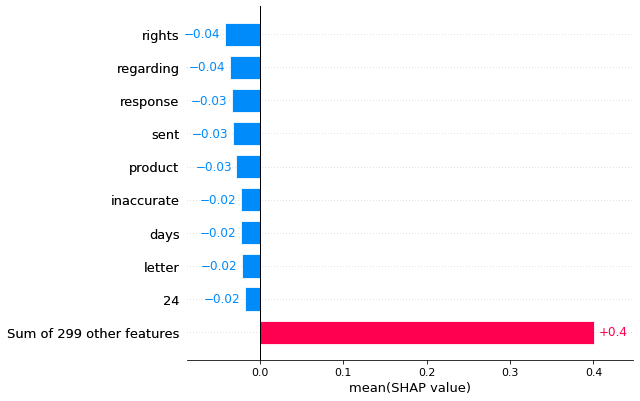

In [17]:
# 汇总看哪些feature 更靠近 Improper use of your report 这个class
# 所以当你一次性放入100句话或者1000句话或者更多的时候 这些impacting words 又会不一样了 
shap.plots.bar(shap_values[:,:,"Incorrect information on your report"].mean(0),order=shap.Explanation.argsort.flip)
shap.plots.bar(shap_values[:,:,"Incorrect information on your report"].mean(0),order=shap.Explanation.argsort)